In [1]:
import os
from PIL import Image

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%cd ../
from src.data.functional import rle_decode
%cd notebooks/

%matplotlib inline
%load_ext autoreload
%autoreload 2

/home/nazar/Projects/airbus_ship_detection
/home/nazar/Projects/airbus_ship_detection/notebooks


In [2]:
sns.set_theme(style='ticks')

# Utility functions

In [3]:
def visualize_samples(df, count=20, title=None):
    if not title:
        title = f'{count} random samples from the dataset'
    
    plt.figure(figsize=(20, 20))
    plt.suptitle(title, fontsize=25)
    
    num_rows = count // 5
    image_ids = df.ImageId.sample(count)
    
    for i, img_id in enumerate(image_ids):
        sample = df.loc[df.ImageId == img_id]
        filename = sample.ImageId.iloc[0]
        img = Image.open(os.path.join('../data/raw/train_v2', filename))
        img_shape = img.size
        mask_img = rle_decode(sample.EncodedPixels.iloc[0], img_shape)
        
        plt.subplot(num_rows, 5, i + 1)
        plt.imshow(img)
        plt.imshow(mask_img, alpha=0.4)
        plt.title(f'Ship(s): {sample.ShipCount.iloc[0]}', fontsize=18)
        plt.axis('off')
        plt.grid(False)
    plt.tight_layout()

# EDA and Visualization

Firstly, let's look at the distribution of our data. It is important to know the proportion of images with and without ships.

In [4]:
raw_df = pd.read_csv('../data/raw/train_ship_segmentations_v2.csv')
print(f'Training dataset contains {len(raw_df)} samples')

Training dataset contains 231723 samples


In [5]:
with_ships = raw_df[~raw_df.EncodedPixels.isna()].ImageId.unique()
without_ships = raw_df[raw_df.EncodedPixels.isna()].ImageId.unique()

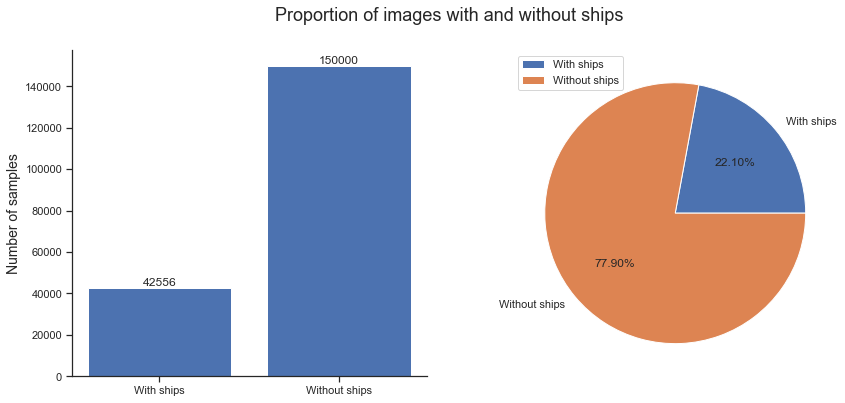

In [6]:
plotting_data = (len(with_ships), len(without_ships))

fig, ax = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle('Proportion of images with and without ships', fontsize=18)
container = ax[0].bar(('With ships', 'Without ships'), plotting_data)
ax[0].bar_label(container)
ax[0].set_ylabel('Number of samples', fontsize=14)

ax[1].pie(plotting_data, labels=('With ships', 'Without ships'), autopct='%.2f%%')
ax[1].legend()
sns.despine();

As we can see, our data is heavily imbalanced. I think we should consider some advanced sampling strategies to lower class imbalance. Usage of some weighted loss function may also help.

Now let's take a closer look at the images with ships. Let's divide them into formal classes based on the amount of ships they include.

In [7]:
cleaned_df = pd.read_csv('../data/interim/data_cleaned.csv')

In [8]:
cleaned_df.head()

,ImageId,EncodedPixels,ShipCount
0,00003e153.jpg,NaN,0
1,0001124c7.jpg,NaN,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,5
4,0001b1832.jpg,NaN,0


We already know that there are 150k of images without and 42.5k images with ships. Let's look in details on the distribution of images with positive ship count

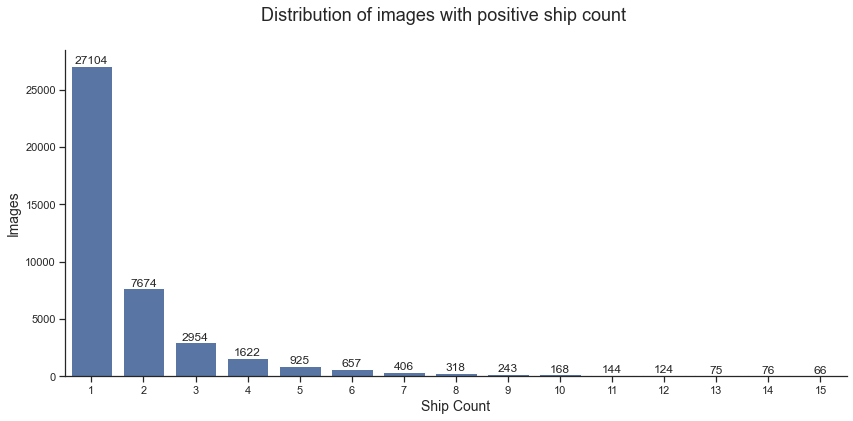

In [9]:
fig = plt.figure(figsize=(14, 6))
fig.suptitle('Distribution of images with positive ship count', fontsize=18)
ax = sns.countplot(x='ShipCount', data=cleaned_df.loc[cleaned_df['ShipCount'] > 0], color='b')
ax.bar_label(ax.containers[0])
ax.set_xlabel('Ship Count', fontsize=14)
ax.set_ylabel('Images', fontsize=14)
sns.despine()

Well, as expected, we mostly have images with 1, 2 and 3 ships on them. To make situation a little bit better, first thing that comes to mind is to train the model on a smaller but more balanced subset. I don't think that we will struggle from the lack of images. In segmentation tasks backpropagation gives us much more information compared to some classification or regression tasks, because we are basically performing pixelwise classification.

So, at least for now, I am going to use a subset below for further training.

In [10]:
balanced_df = pd.read_csv('../data/interim/balanced_data.csv')
print(f'Subset contains {len(balanced_df)} unique samples')

Subset contains 16778 unique samples


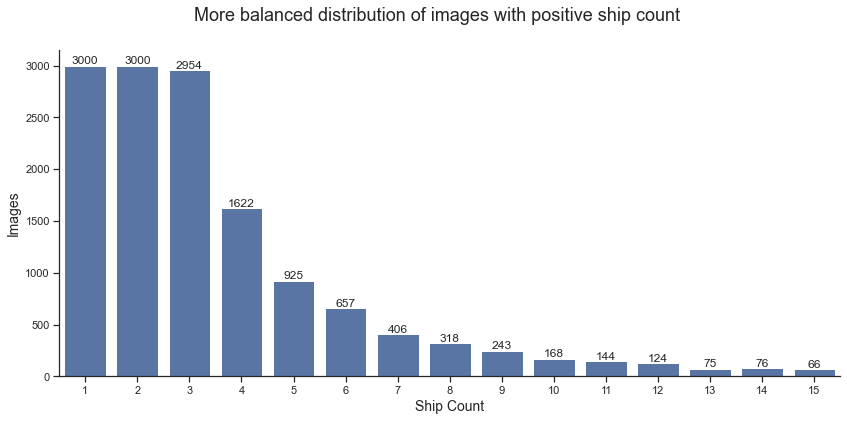

In [11]:
fig = plt.figure(figsize=(14, 6))
fig.suptitle('More balanced distribution of images with positive ship count', fontsize=18)
ax = sns.countplot(x='ShipCount', data=balanced_df.loc[balanced_df['ShipCount'] > 0], color='b')
ax.bar_label(ax.containers[0])
ax.set_xlabel('Ship Count', fontsize=14)
ax.set_ylabel('Images', fontsize=14)
sns.despine()

Now, when we know what to expect, let's finally check out the actual images

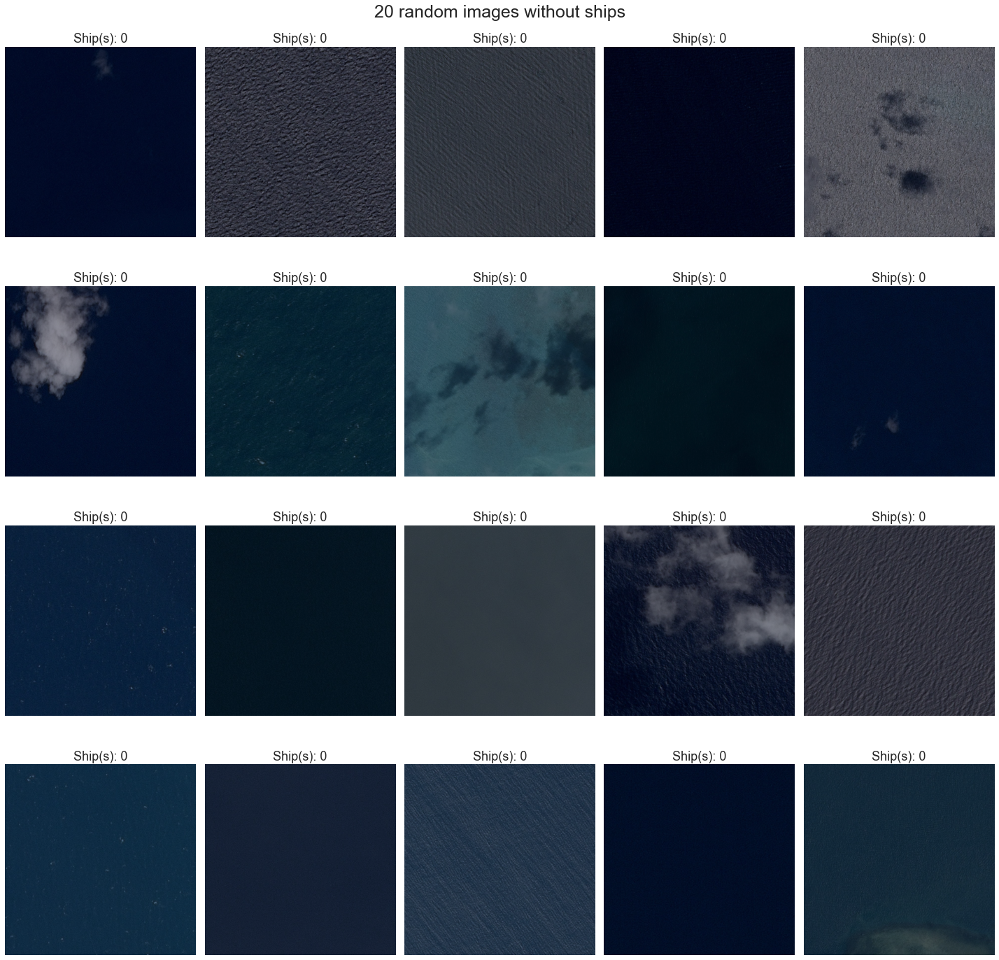

In [12]:
# plot images without ships
no_ships = balanced_df.loc[balanced_df.EncodedPixels.isna()]
visualize_samples(no_ships, title='20 random images without ships')

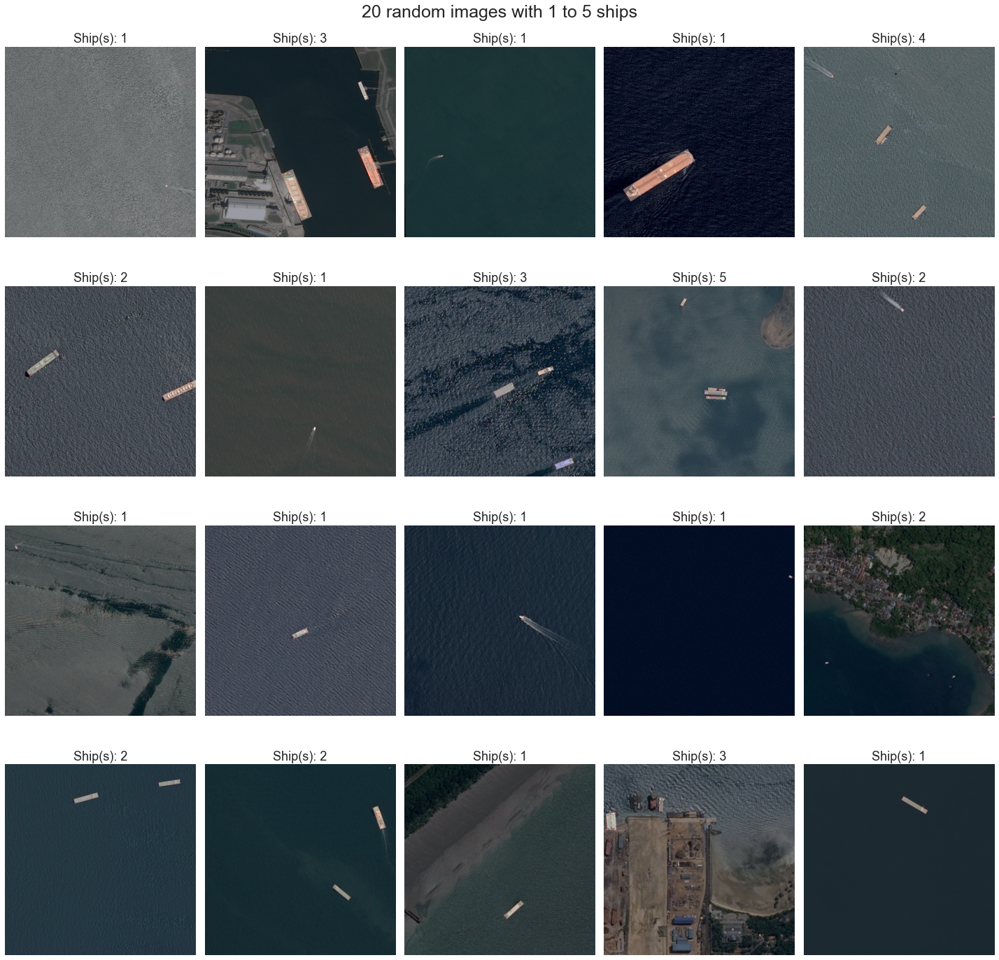

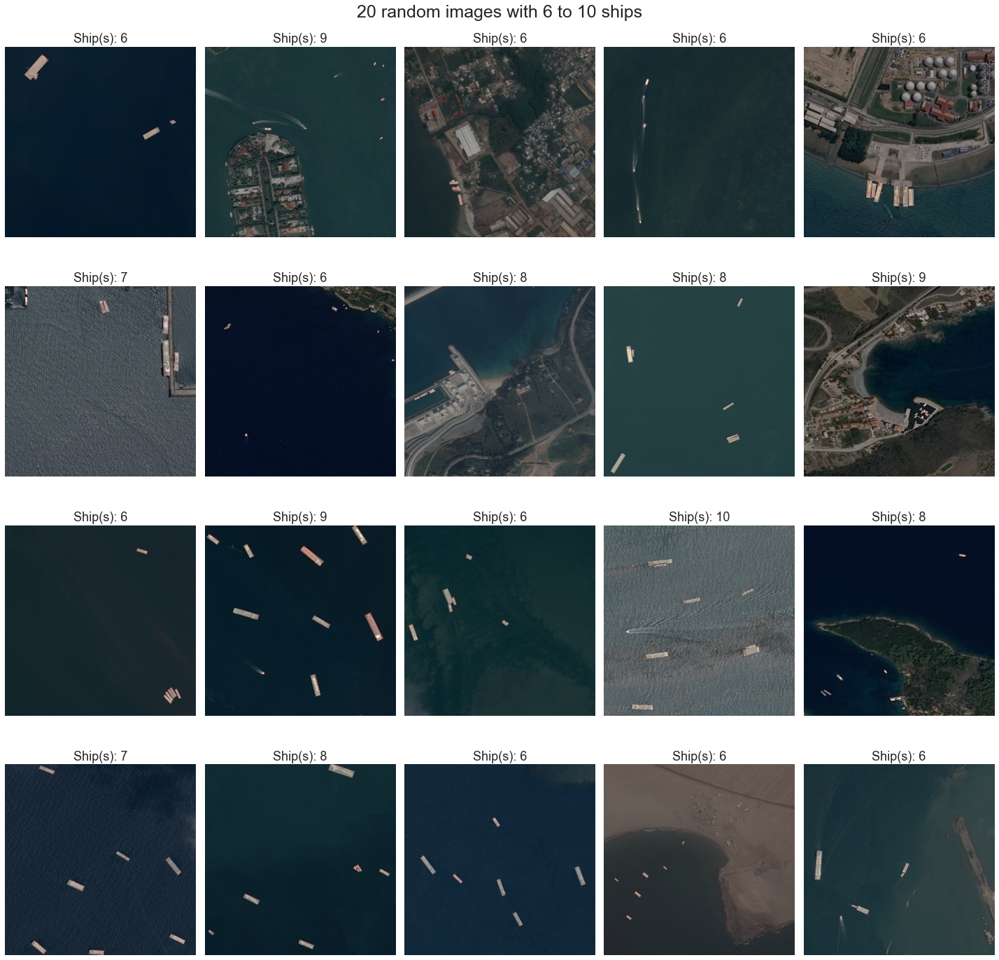

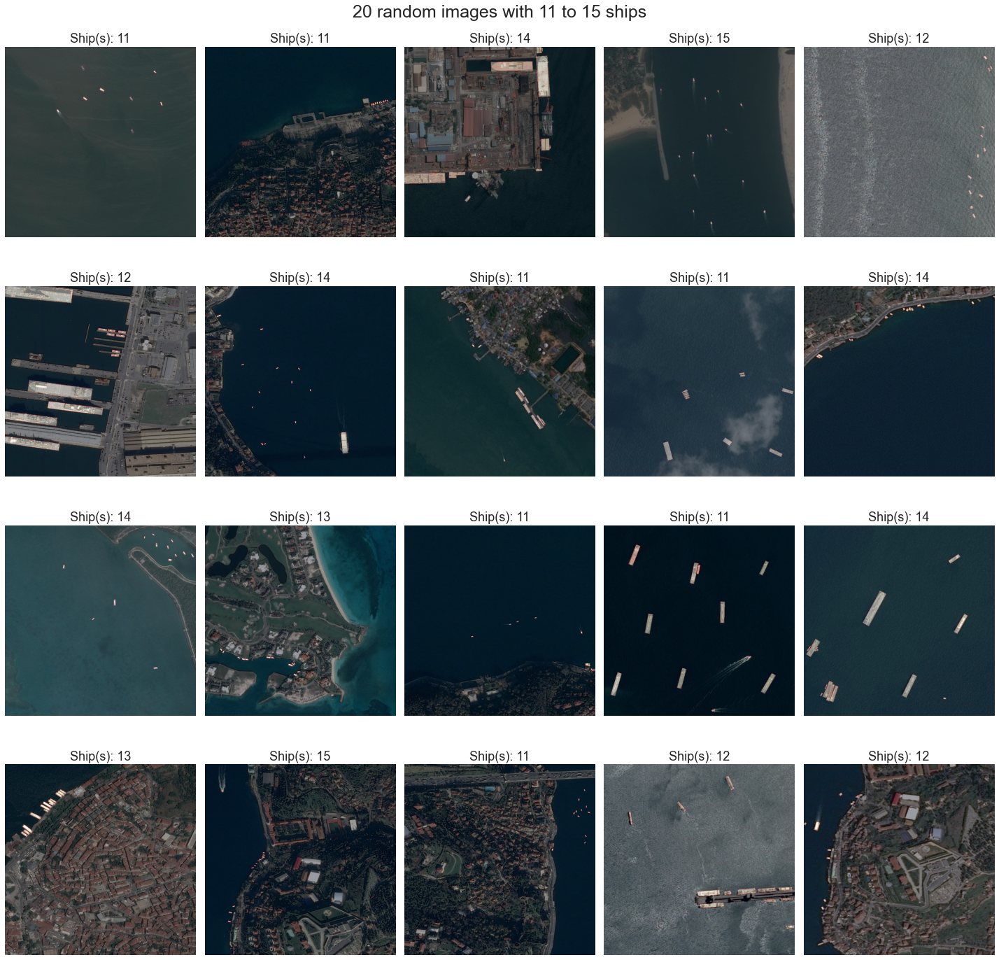

In [13]:
for i in range(1, 16, 5):
    ships_df = balanced_df.loc[balanced_df.ShipCount.between(i, i + 5, 'left')]
    visualize_samples(ships_df, title=f'20 random images with {i} to {i + 4} ships')